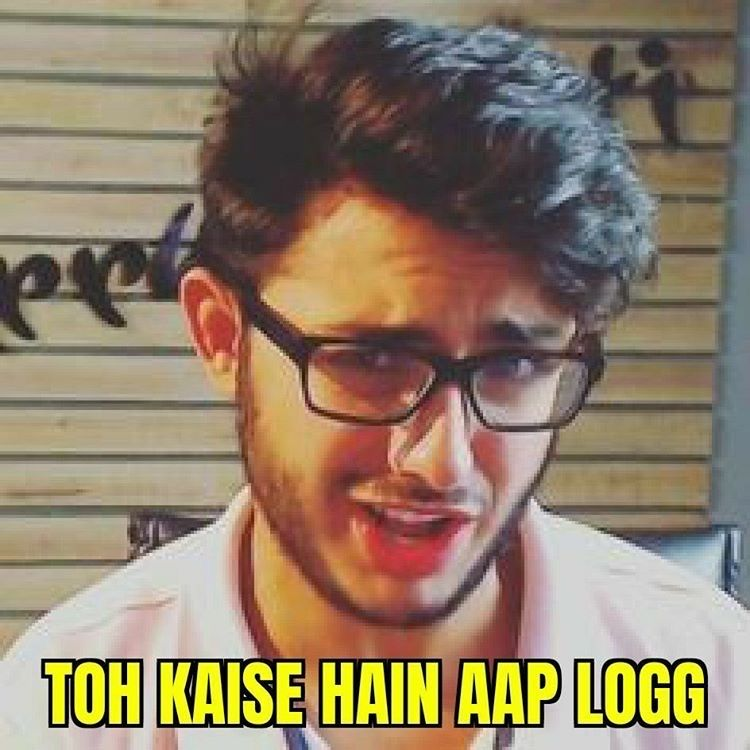

# Unsupervised Machine Learning

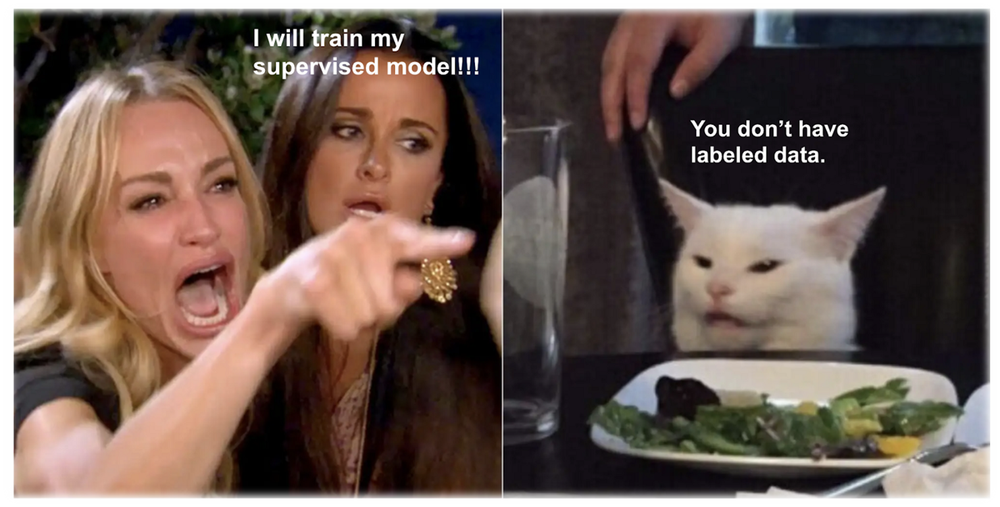

#### Unsupervised learning is a class of machine learning in which we provide the algorithm, unlabelled data

#### The model tries to find the hidden patterns/structures in unlabelled data.

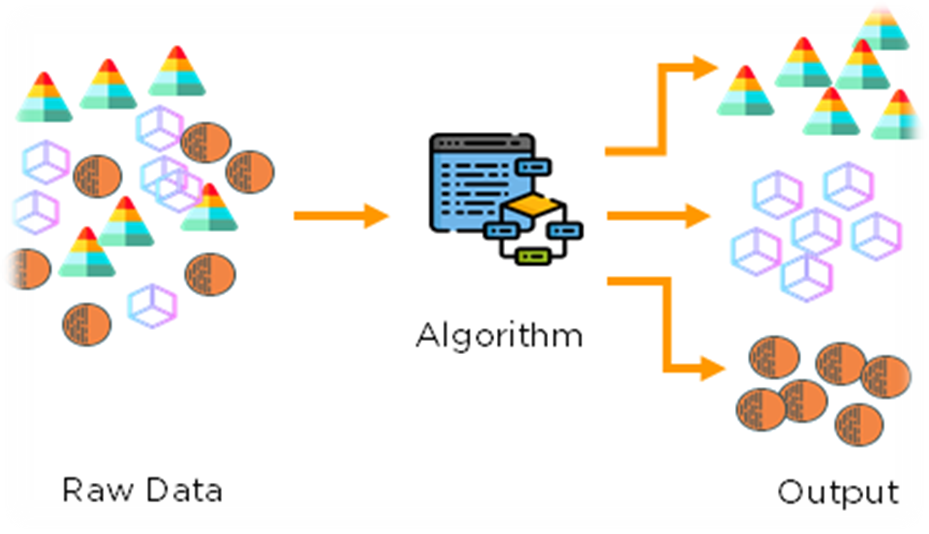

#### We have unstructured raw data with no output variable (label)
#### We dump the data to a unsupervised ML algorithm
#### The algorithm tries to find the patters in the data
#### Processes the information 
#### After training, the model turns the data into groups based on similarities/differences/patterns/structure


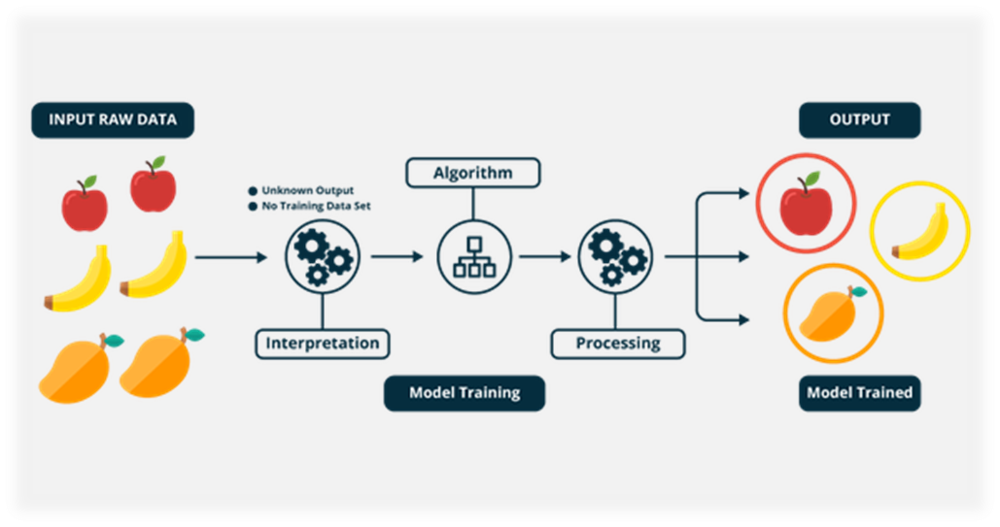

### Type of Unsupervised Learning - Clustering

#### Clustering groups similar data into clusters
#### Most commonly used technique
#### The model tries to find hidden patterns/structures and/or differences in the data by itself.
#### If any natural groups or classes exist, the model will be able to discover them

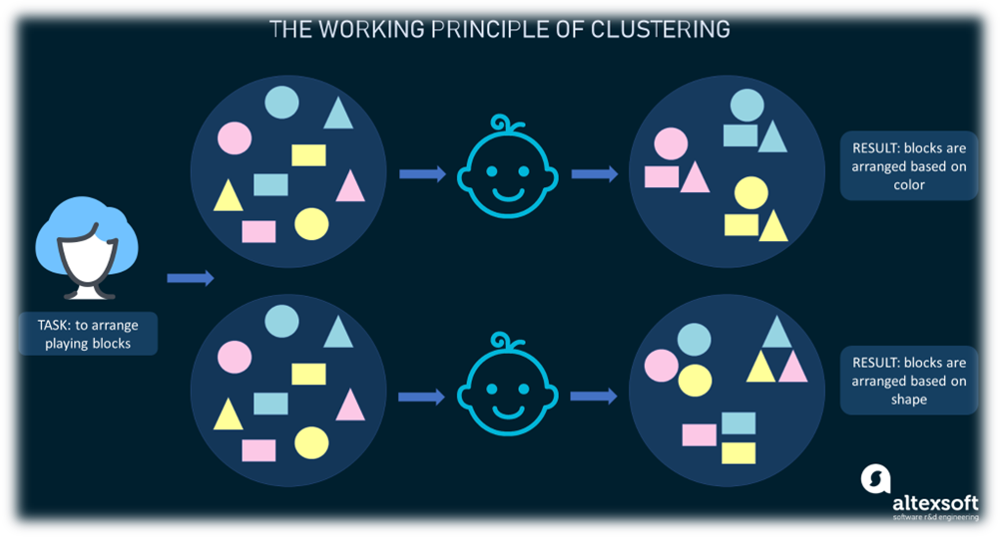

### Use Cases

#### 1) Anomaly Detection

* ***Anomaly refers to identifying datapoints in data that do not fit the normal pattern or identifying abnormal datapoints that significantly differ from standard behaviour***
* ***Anomalies in data are also called standard deviation, outliers, noise, novelties and exceptions***
* ***Examples include fraud detection, medical diagnosis***

#### 2) Pattern Recognition (grouping images)
#### 3) Customer and market segmentation
#### 4) Audience segmentation 

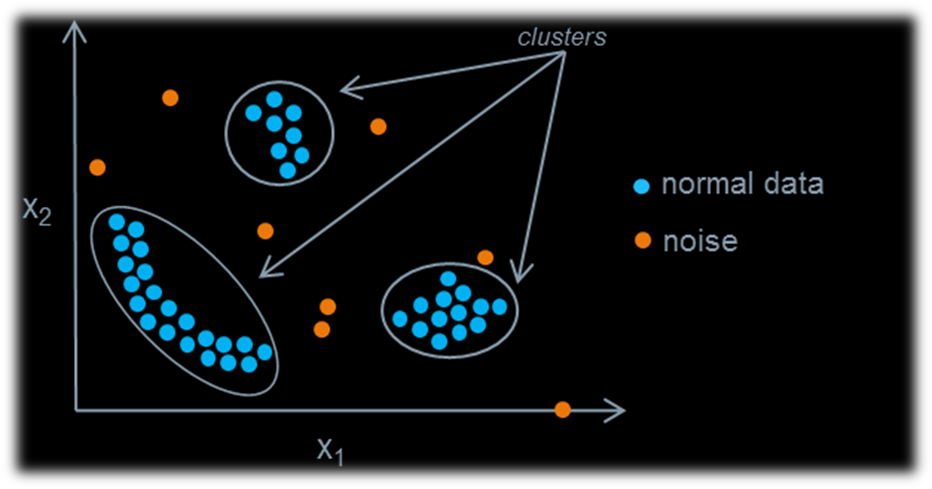

### Supervised Vs Unsupervised Learning

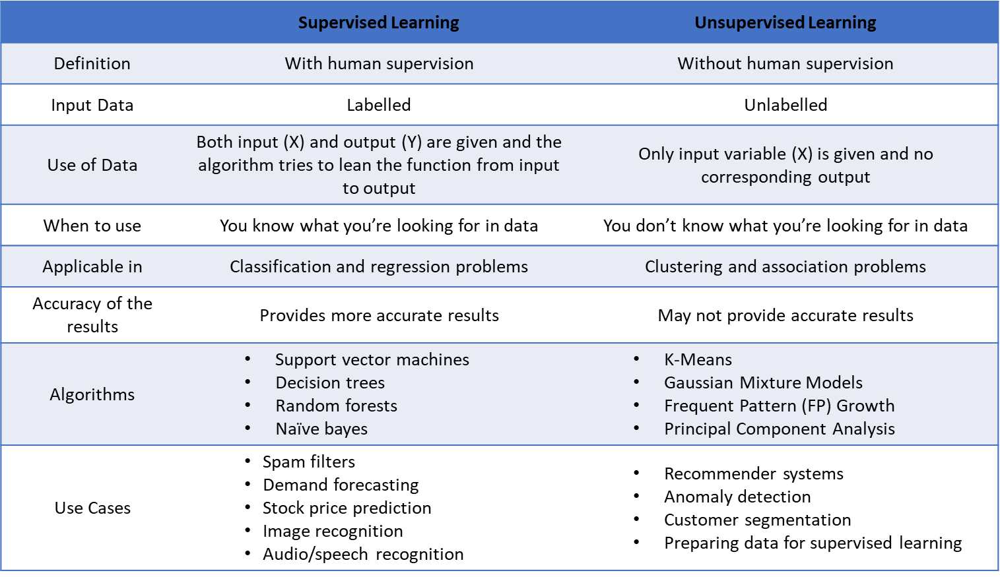

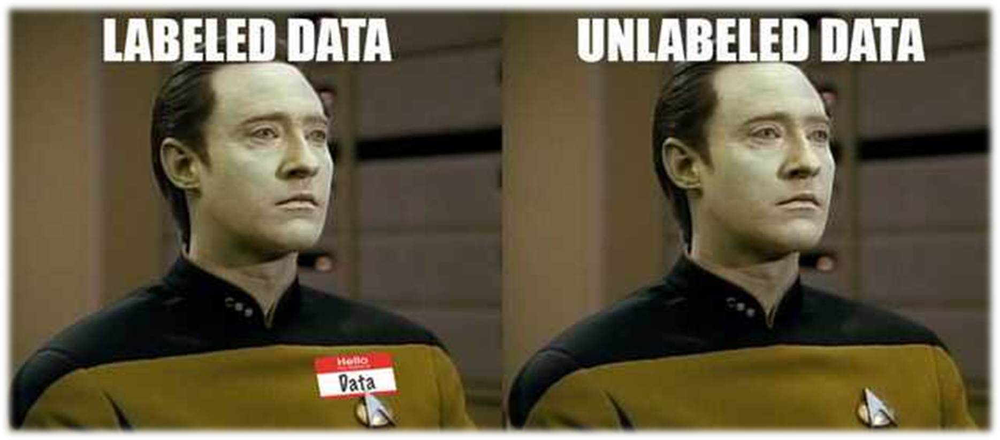

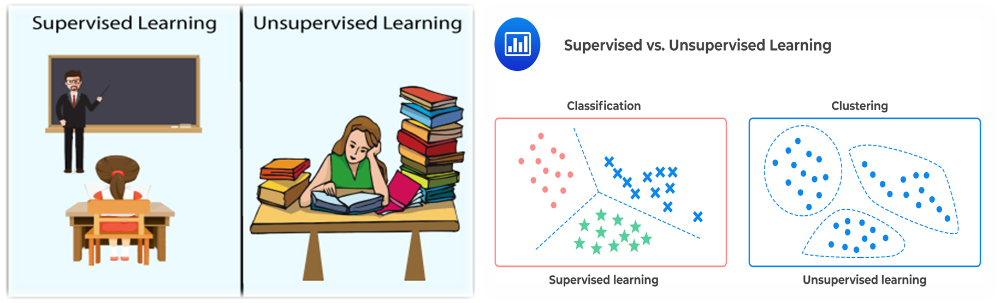

### K-Means Clustering

#### The K-means clustering algorithm attempts to group similar items into clusters
#### Where 'K' represents the number of groups

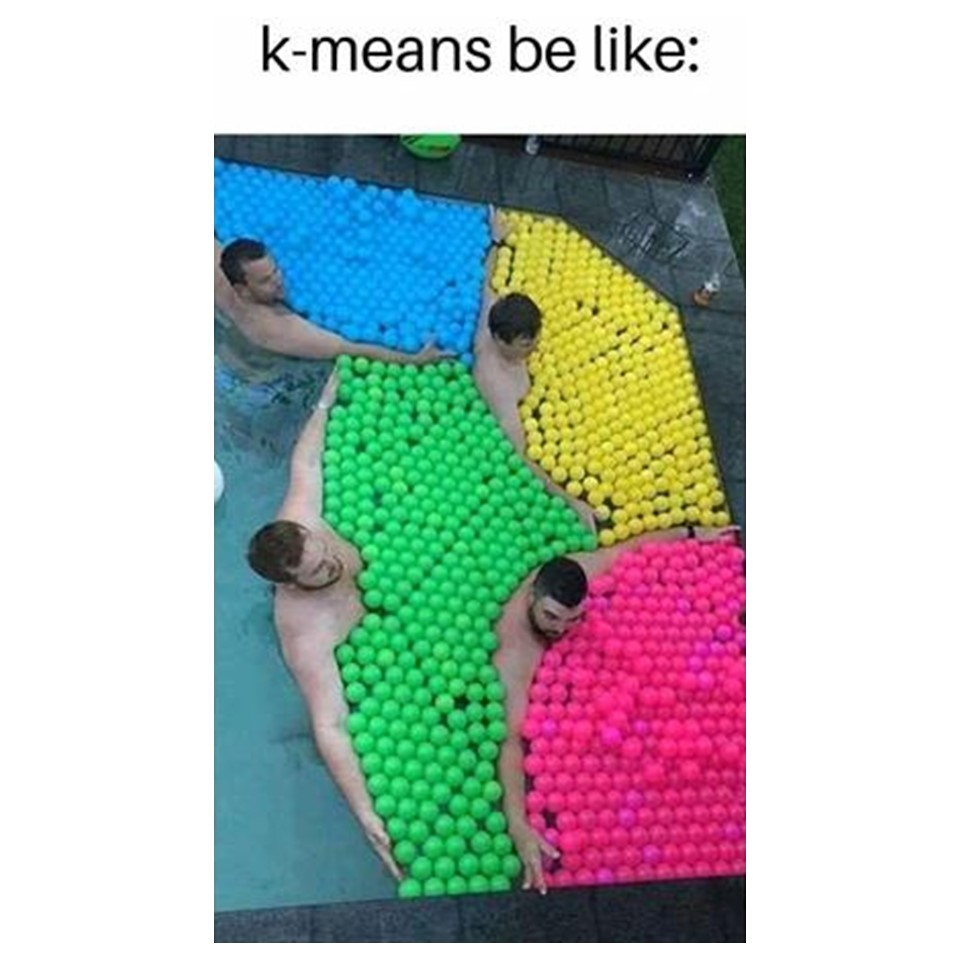

In [9]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

#### We'll take Iris Dataset and remove 'Sepal length and width' features

In [104]:
data = pd.read_csv('Iris.csv')
data.head(5)

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,1,5.1,3.5,1.4,0.2,Iris-setosa
1,2,4.9,3.0,1.4,0.2,Iris-setosa
2,3,4.7,3.2,1.3,0.2,Iris-setosa
3,4,4.6,3.1,1.5,0.2,Iris-setosa
4,5,5.0,3.6,1.4,0.2,Iris-setosa


In [105]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             150 non-null    int64  
 1   SepalLengthCm  150 non-null    float64
 2   SepalWidthCm   150 non-null    float64
 3   PetalLengthCm  150 non-null    float64
 4   PetalWidthCm   150 non-null    float64
 5   Species        150 non-null    object 
dtypes: float64(4), int64(1), object(1)
memory usage: 7.2+ KB


In [106]:
data.tail(5)

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
145,146,6.7,3.0,5.2,2.3,Iris-virginica
146,147,6.3,2.5,5.0,1.9,Iris-virginica
147,148,6.5,3.0,5.2,2.0,Iris-virginica
148,149,6.2,3.4,5.4,2.3,Iris-virginica
149,150,5.9,3.0,5.1,1.8,Iris-virginica


In [107]:
data.describe()

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
count,150.000000,150.000000,150.000000,150.000000,150.000000
mean,75.500000,5.843333,3.054000,3.758667,1.198667
std,43.445368,0.828066,0.433594,1.764420,0.763161
min,1.000000,4.300000,2.000000,1.000000,0.100000
25%,38.250000,5.100000,2.800000,1.600000,0.300000
50%,75.500000,5.800000,3.000000,4.350000,1.300000
75%,112.750000,6.400000,3.300000,5.100000,1.800000
max,150.000000,7.900000,4.400000,6.900000,2.500000


In [108]:
y = data[['Species']]
y.head(5)

,Species
0,Iris-setosa
1,Iris-setosa
2,Iris-setosa
3,Iris-setosa
4,Iris-setosa


#### Replacing 'Categorical labels' with 'Discrete labels'

In [32]:
y.replace(['Iris-setosa', 'Iris-versicolor', 'Iris-virginica'], [0,1,2], inplace = True)

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_19776\2428864675.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y.replace(['Iris-setosa', 'Iris-versicolor', 'Iris-virginica'], [0,1,2], inplace = True)


#### Just Taking Petal length and width as our features 

#### No need to add labels as in unsupervised learning, we do not have target variables

In [109]:
X = data[['PetalLengthCm', 'PetalWidthCm']]
X.head(5)

,PetalLengthCm,PetalWidthCm
0,1.4,0.2
1,1.4,0.2
2,1.3,0.2
3,1.5,0.2
4,1.4,0.2


In [110]:
X['Species'] = y

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_19776\1050460548.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Species'] = y


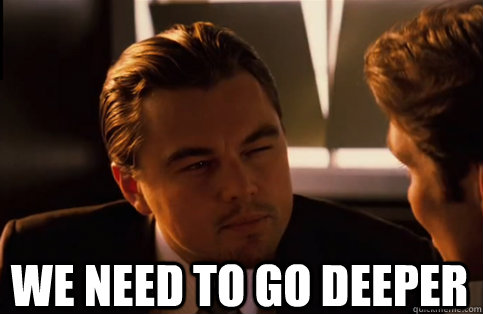

In [111]:
X.head(5)

,PetalLengthCm,PetalWidthCm,Species
0,1.4,0.2,Iris-setosa
1,1.4,0.2,Iris-setosa
2,1.3,0.2,Iris-setosa
3,1.5,0.2,Iris-setosa
4,1.4,0.2,Iris-setosa


#### Extracting Setosa 

In [113]:
setosa = X[X.Species == 0]
setosa.head(5)

,PetalLengthCm,PetalWidthCm,Species


#### Extracting Versicolor

In [41]:
versicolor = X[X.Species == 1]
versicolor.head(5)

,PetalLengthCm,PetalWidthCm,Species
50,4.7,1.4,1
51,4.5,1.5,1
52,4.9,1.5,1
53,4.0,1.3,1
54,4.6,1.5,1


#### Extracting Verginica

In [42]:
verginica = X[X.Species == 2]
verginica.head(5)

,PetalLengthCm,PetalWidthCm,Species
100,6.0,2.5,2
101,5.1,1.9,2
102,5.9,2.1,2
103,5.6,1.8,2
104,5.8,2.2,2


In [40]:
setosa.Species.unique()

array([0], dtype=int64)

#### Plotting all Species of Flowers

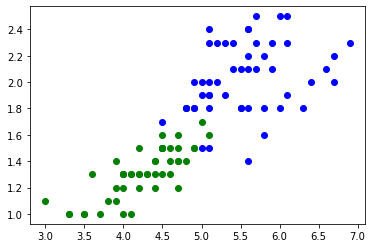

In [114]:
plt.scatter(setosa.PetalLengthCm, setosa.PetalWidthCm, color = 'red')
plt.scatter(versicolor.PetalLengthCm, versicolor.PetalWidthCm, color = 'green')
plt.scatter(verginica.PetalLengthCm, verginica.PetalWidthCm, color = 'blue')


In [115]:
X.head(5)

,PetalLengthCm,PetalWidthCm,Species
0,1.4,0.2,Iris-setosa
1,1.4,0.2,Iris-setosa
2,1.3,0.2,Iris-setosa
3,1.5,0.2,Iris-setosa
4,1.4,0.2,Iris-setosa


In [116]:
X.drop('Species', axis = 1, inplace = True)
X.head(5)

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_19776\1050280589.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.drop('Species', axis = 1, inplace = True)


,PetalLengthCm,PetalWidthCm
0,1.4,0.2
1,1.4,0.2
2,1.3,0.2
3,1.5,0.2
4,1.4,0.2


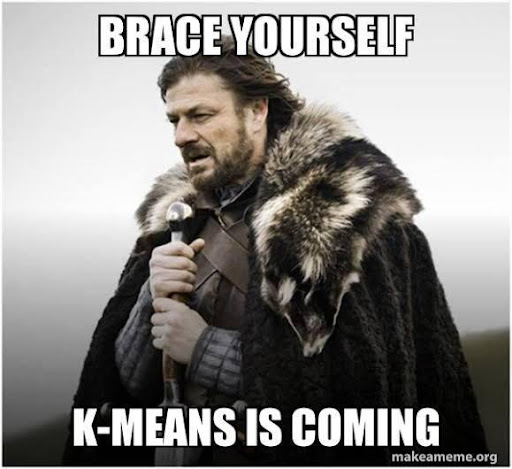

#### Training Kmeans algorithm and setting number of clusters (k value) to 3 (as we already know that  we have 3 different species of flowers)

In [120]:
model = KMeans(3)
predictions = model.fit_predict(X)
print(f'Our Predictions are; {predictions}')

Our Predictions are; [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 2 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 1 2 2 2 2
 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2
 2 2]


#### In order to plot the clusters, let's add prediction column in our original data

In [122]:
X.head(5)

,PetalLengthCm,PetalWidthCm,Predictions
0,1.4,0.2,1
1,1.4,0.2,1
2,1.3,0.2,1
3,1.5,0.2,1
4,1.4,0.2,1


In [123]:
X['Predictions'] = predictions
X.head(3)

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_19776\2848661488.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Predictions'] = predictions


,PetalLengthCm,PetalWidthCm,Predictions
0,1.4,0.2,0
1,1.4,0.2,0
2,1.3,0.2,0


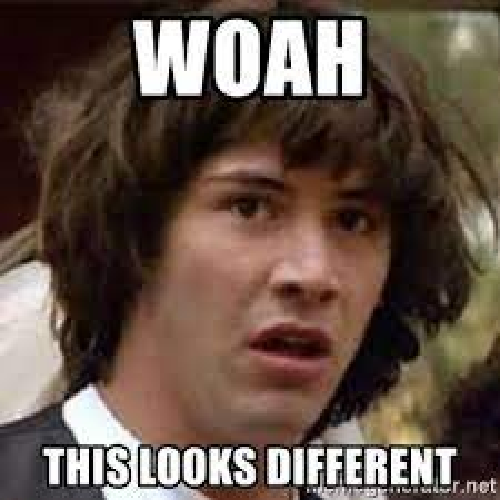

In [124]:
cluster1 = X[X.Predictions == 0]
cluster1

,PetalLengthCm,PetalWidthCm,Predictions
0,1.4,0.2,0
1,1.4,0.2,0
2,1.3,0.2,0
3,1.5,0.2,0
4,1.4,0.2,0
5,1.7,0.4,0
6,1.4,0.3,0
7,1.5,0.2,0
8,1.4,0.2,0
9,1.5,0.1,0


In [125]:
cluster2 = X[X.Predictions == 1]
cluster2.Predictions.count()

52

In [126]:
cluster3 = X[X.Predictions == 2]
cluster3.Predictions.count()

48

#### Let's Do Some Plotting

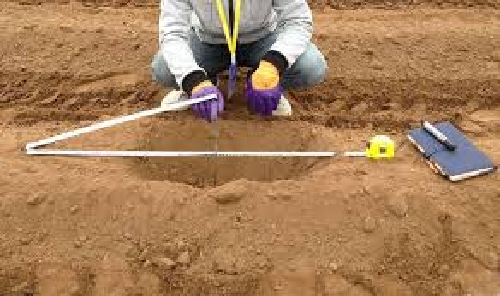

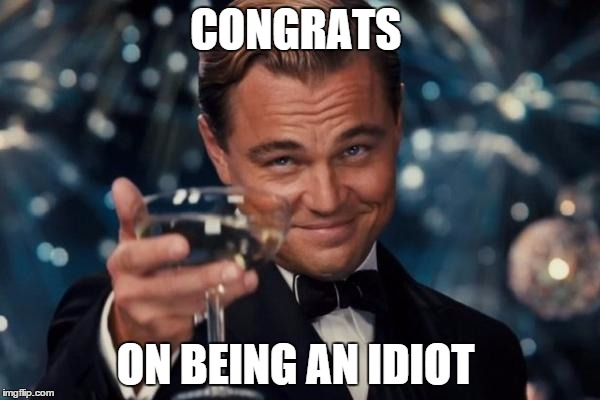

### Plotting Means MATPLOTLIB !!!!

#### Plotting clusters made by the model

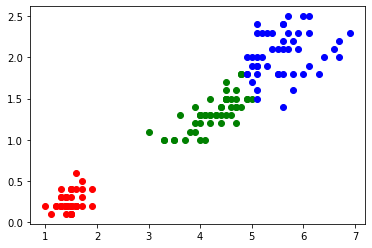

In [134]:
plt.scatter(cluster1.PetalLengthCm, cluster1.PetalWidthCm, color = 'red')
plt.scatter(cluster2.PetalLengthCm, cluster2.PetalWidthCm, color = 'green')
plt.scatter(cluster3.PetalLengthCm, cluster3.PetalWidthCm, color = 'blue')

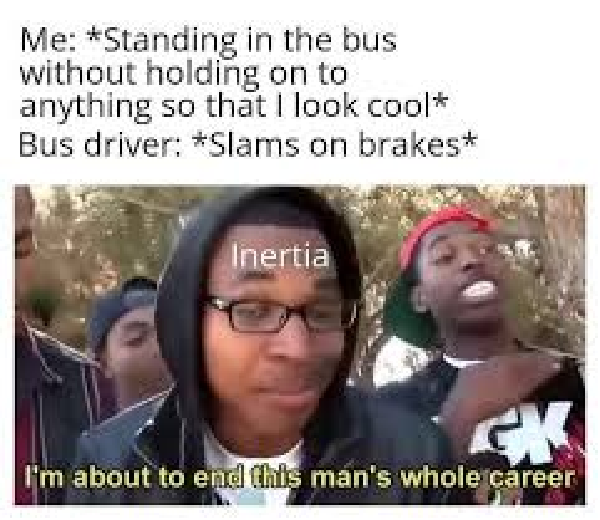

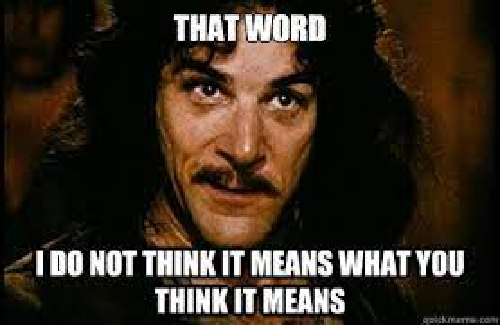

### In order to calculate the error made by the model, we'll use ''intertia_'' from the model

### intertia_

In [135]:
X.head(3)

,PetalLengthCm,PetalWidthCm,Predictions
0,1.4,0.2,0
1,1.4,0.2,0
2,1.3,0.2,0


In [136]:
model.inertia_

31.387758974358984

### Elbow Method

#### Elbow is one of the most well-known methods for determining the appropriate value of k and improving model performance

#### It is an iterative procedure for determining the best value of K
#### It selects the best value from a range of options
#### It computes the sum of the squares of the points and the average distance

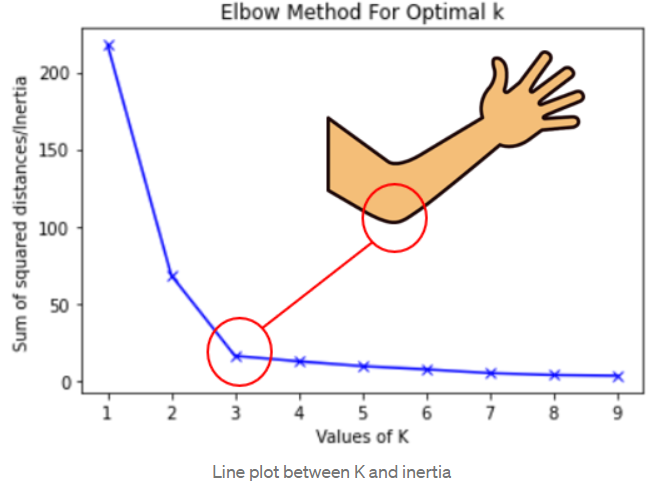

#### Calculating Sum Squared Error in order to select the best possible K value

In [131]:
sse = []

for k in range(1,11,1):
    kmeans = KMeans(n_clusters = k)
    kmeans.fit(X)
    sse.append(kmeans.inertia_)
    
sse

C:\Users\ADMIN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[648.6167999999999,
 112.11161021984549,
 31.387758974358984,
 22.67543143812709,
 14.206605868205866,
 11.42859696969697,
 9.3935009253904,
 8.101856520672312,
 6.867350742240217,
 5.948665537249129]

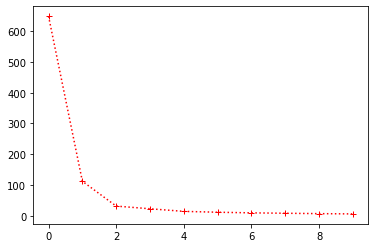

In [132]:
plt.plot(sse, ':r+')

#### Centroid

#### A centroid is the imaginary or real location representing the center of the cluster

##### cluster_centers_ is used to calculate the centroids of the clusters

In [133]:
centroids = model.cluster_centers_
centroids

array([[1.46400000e+00, 2.44000000e-01, 1.00000000e+00],
       [4.26923077e+00, 1.34230769e+00, 2.00000000e+00],
       [5.59583333e+00, 2.03750000e+00, 6.66133815e-16]])

#### Plotting Clusters and their Centroids

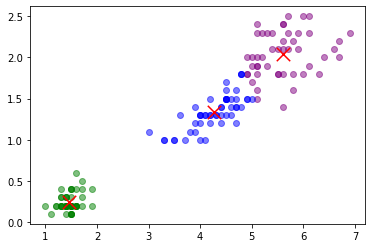

In [103]:
plt.scatter(cluster1.PetalLengthCm, cluster1.PetalWidthCm, color = 'purple', alpha = 0.5)
plt.scatter(cluster2.PetalLengthCm, cluster2.PetalWidthCm, color = 'green', alpha = 0.5)
plt.scatter(cluster3.PetalLengthCm, cluster3.PetalWidthCm, color = 'blue', alpha = 0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], color = 'red', marker = 'x', s = 180)